# American Sign Language real-time detection 

In [1]:
import os
import mediapipe as mp
import cv2
import matplotlib.pyplot as plt
import pickle
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [2]:
mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils 
mp_drawing_styles = mp.solutions.drawing_styles
hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.9)

In [3]:
# data_dir = 'asl_dataset'
# data = []
# labels = []
# sub_dirs = ['train', 'test']

# for sub_dir in sub_dirs:
#     for i in sorted(os.listdir(os.path.join(data_dir, sub_dir))):
#         if i == '.DS_Store':
#             continue
#         for j in os.listdir(os.path.join(data_dir, sub_dir, i)):
#             img_path = os.path.join(data_dir, sub_dir, i, j)
#             if os.path.isfile(img_path):  # Check if it's a file, not a directory
#                 img = cv2.imread(img_path)
#                 if img is not None:
#                     data_aux = []
#                     img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#                     results = hands.process(img_rgb)
#                     if results.multi_hand_landmarks:
#                         for hand_landmarks in results.multi_hand_landmarks:
#                             for z in range(len(hand_landmarks.landmark)):
#                                 x = hand_landmarks.landmark[z].x
#                                 y = hand_landmarks.landmark[z].y
#                                 data_aux.append(x)
#                                 data_aux.append(y)
#                         data.append(data_aux)
#                         labels.append(i)
#                 else:
#                     print(f"Image not loaded: {img_path}")
#             else:
#                 print(f"Skipped directory: {img_path}")

# # save data
# with open('data.pickle', 'wb') as f:
#     pickle.dump({'data':data,'labels':labels}, f)

KeyboardInterrupt: 

In [4]:
data_dir = 'asl_dataset'
data = []
labels = []
sub_dirs = ['train', 'test']

for sub_dir in sub_dirs:
    for idx, i in enumerate(sorted(os.listdir(os.path.join(data_dir, sub_dir)))):
        if i == '.DS_Store':
            continue
        for j in os.listdir(os.path.join(data_dir, sub_dir, i)):
            img_path = os.path.join(data_dir, sub_dir, i, j)
            if os.path.isfile(img_path):  # Check if it's a file, not a directory
                img = cv2.imread(img_path)
                if img is not None:
                    data_aux = []
                    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                    results = hands.process(img_rgb)
                    if results.multi_hand_landmarks:
                        for hand_landmarks in results.multi_hand_landmarks:
                            for z in range(len(hand_landmarks.landmark)):
                                x = hand_landmarks.landmark[z].x
                                y = hand_landmarks.landmark[z].y
                                data_aux.append(x)
                                data_aux.append(y)
                        data.append(data_aux)
                        labels.append(i)
                else:
                    print(f"Image not loaded: {img_path}")
            else:
                print(f"Skipped directory: {img_path}")
        print(f"Processed class {i} ({idx+1}/{len(os.listdir(os.path.join(data_dir, sub_dir)))})")

# save data
with open('data.pickle', 'wb') as f:
    pickle.dump({'data':data,'labels':labels}, f)

Processed class A (1/28)
Processed class B (2/28)
Processed class C (3/28)
Processed class D (4/28)
Processed class E (5/28)
Processed class F (6/28)
Processed class G (7/28)
Processed class H (8/28)
Processed class I (9/28)
Processed class J (10/28)
Processed class K (11/28)
Processed class L (12/28)
Processed class M (13/28)
Processed class N (14/28)
Processed class Nothing (15/28)
Processed class O (16/28)
Processed class P (17/28)
Processed class Q (18/28)
Processed class R (19/28)
Processed class S (20/28)
Processed class Space (21/28)
Processed class T (22/28)
Processed class U (23/28)
Processed class V (24/28)
Processed class W (25/28)
Processed class X (26/28)
Processed class Y (27/28)
Processed class Z (28/28)
Processed class A (1/28)
Processed class B (2/28)
Processed class C (3/28)
Processed class D (4/28)
Processed class E (5/28)
Processed class F (6/28)
Processed class G (7/28)
Processed class H (8/28)
Processed class I (9/28)
Processed class J (10/28)
Processed class K (1

In [10]:
# data_dir = 'asl_dataset'
# data = []
# labels = []
# for i in sorted(os.listdir(data_dir)):
#     if i == '.DS_Store':
#         pass
#     else:
#         for j in os.listdir(os.path.join(data_dir,i)):
#             data_aux = []
#             img = cv2.imread('asl_dataset/Test/A/3001.jpg')
#             img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#             results = hands.process(img_rgb)
#             if results.multi_hand_landmarks:
#                 for hand_landmarks in results.multi_hand_landmarks:
#                     for z in range(len(hand_landmarks.landmark)):
#                         x = hand_landmarks.landmark[z].x
#                         y = hand_landmarks.landmark[z].y
#                         data_aux.append(x)
#                         data_aux.append(y)
#                 data.append(data_aux)
#                 labels.append(i)
                
# # save data
# f = open('data.pickle', 'wb')
# pickle.dump({'data':data,'labels':labels},f)
# f.close() 

In [9]:
# # visualize landmarks
# data_dir = 'asl_dataset'
# for i in sorted(os.listdir(data_dir)):
#     if i == '.DS_Store':
#         pass
#     else:
#         for j in os.listdir(os.path.join(data_dir,i))[0:1]:
#             img = cv2.imread(os.path.join(data_dir,i,j))
#             img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

#             results = hands.process(img_rgb)
#             if results.multi_hand_landmarks:
#                 for hand_landmarks in results.multi_hand_landmarks:
#                     mp_drawing.draw_landmarks(
#                         img_rgb, # img to draw
#                         hand_landmarks,
#                         mp_hands.HAND_CONNECTIONS,
#                         mp_drawing_styles.get_default_hand_landmarks_style(),
#                         mp_drawing_styles.get_default_hand_connections_style()

#                     )

            
#             plt.figure()
#             plt.title(i)
#             plt.imshow(img_rgb)
# plt.show()

error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


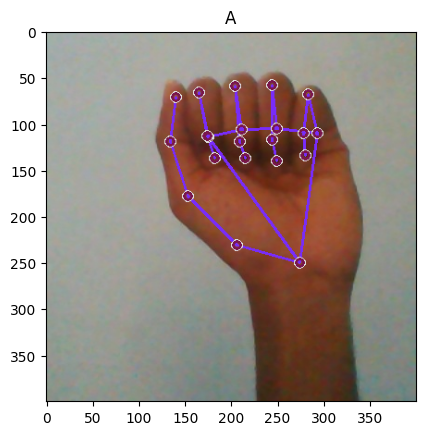

Processed class A (28/28)


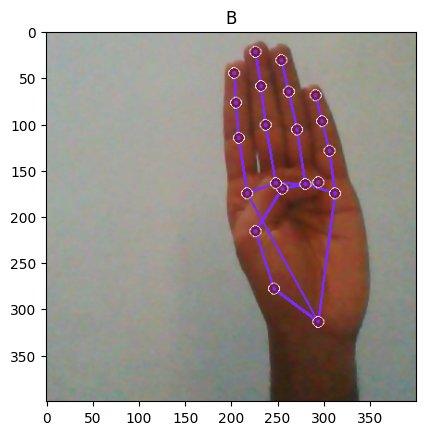

Processed class B (28/28)


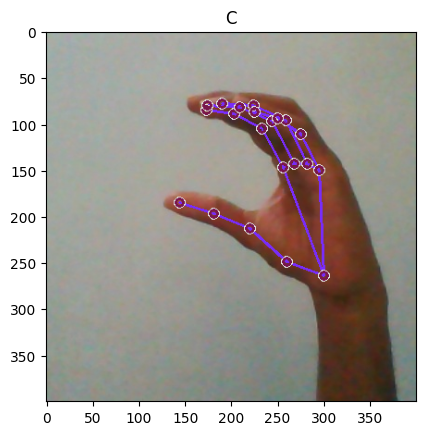

Processed class C (28/28)


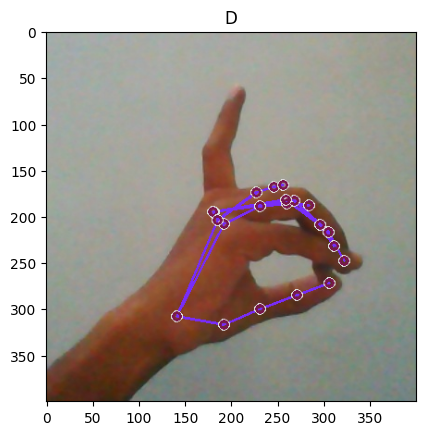

Processed class D (28/28)


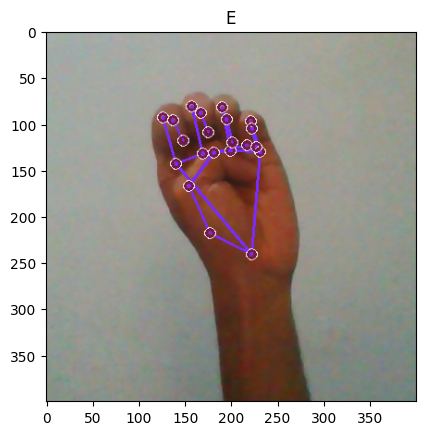

Processed class E (28/28)


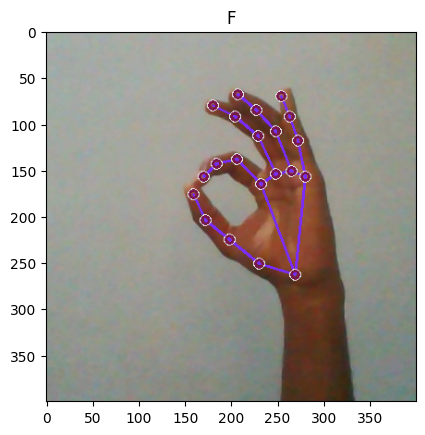

Processed class F (28/28)


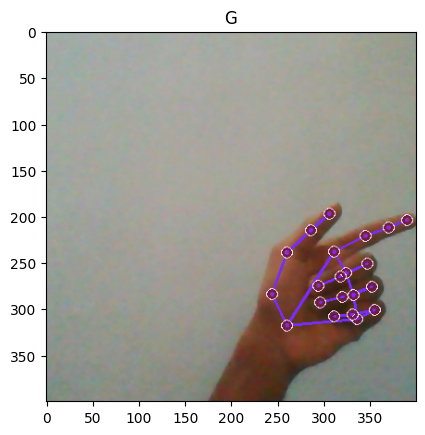

Processed class G (28/28)


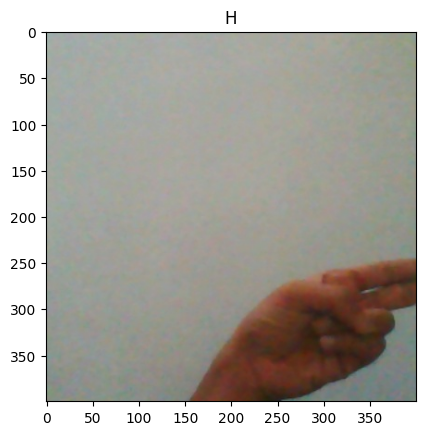

Processed class H (28/28)


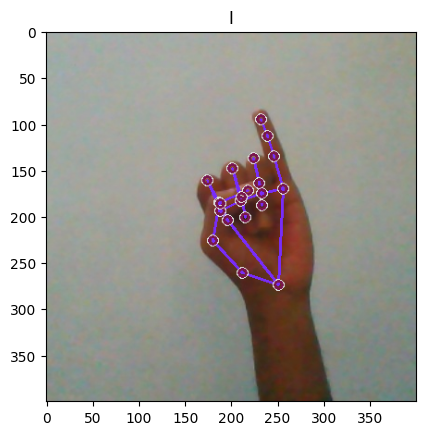

Processed class I (28/28)


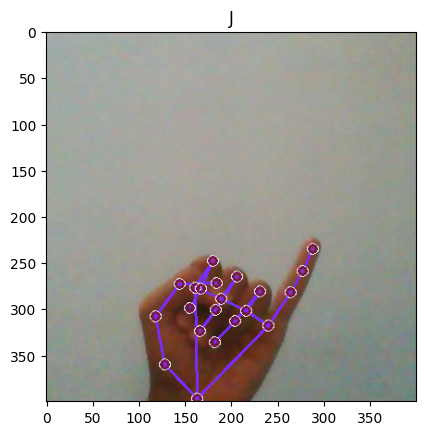

Processed class J (28/28)


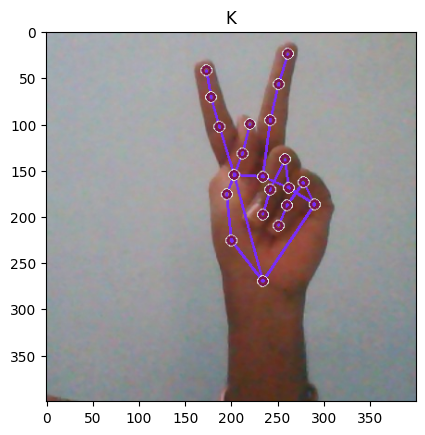

Processed class K (28/28)


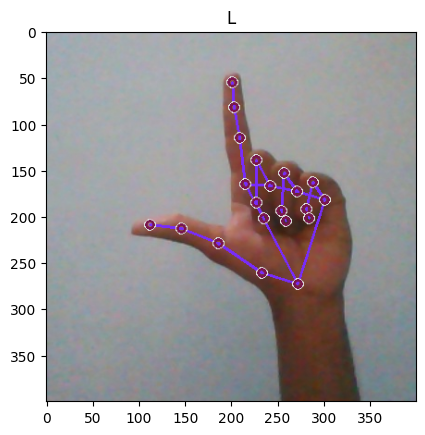

Processed class L (28/28)


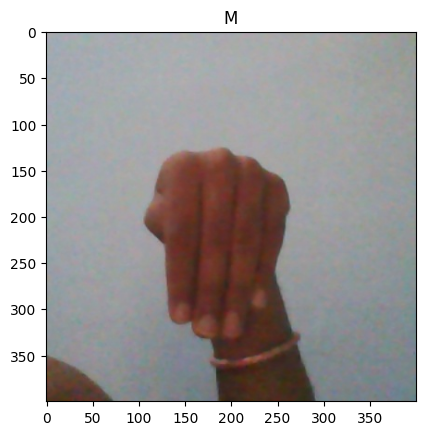

Processed class M (28/28)


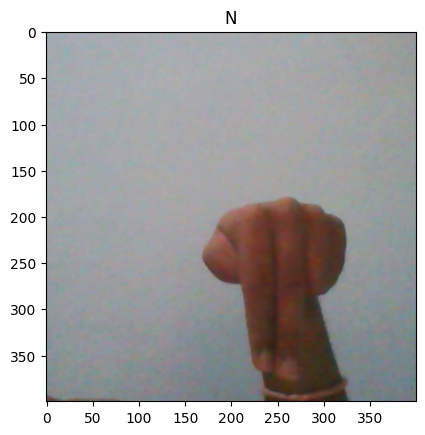

Processed class N (28/28)


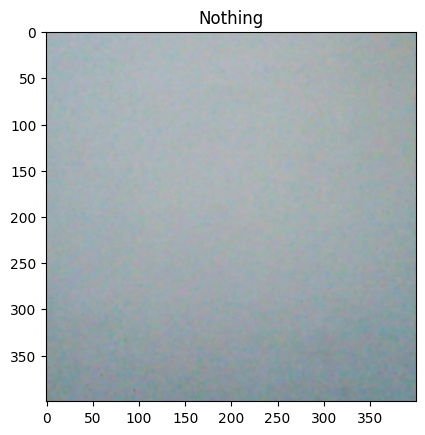

Processed class Nothing (28/28)


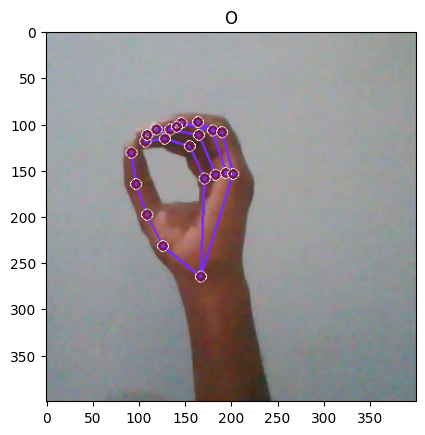

Processed class O (28/28)


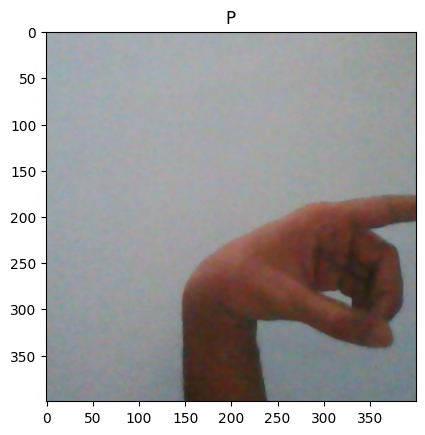

Processed class P (28/28)


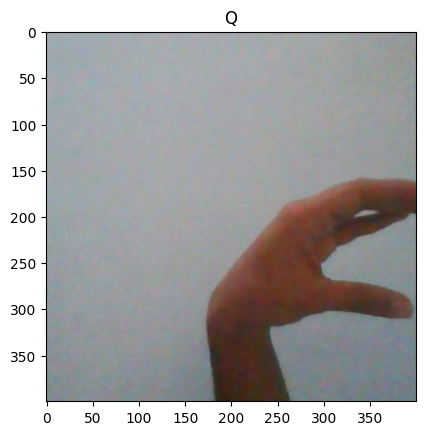

Processed class Q (28/28)


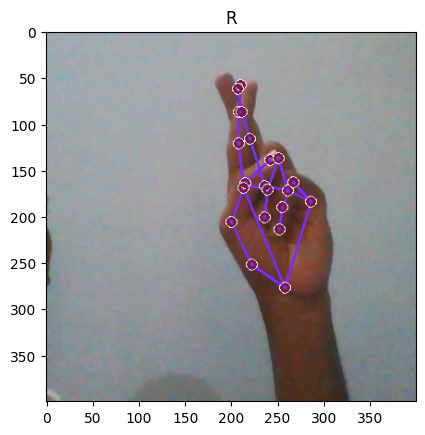

Processed class R (28/28)


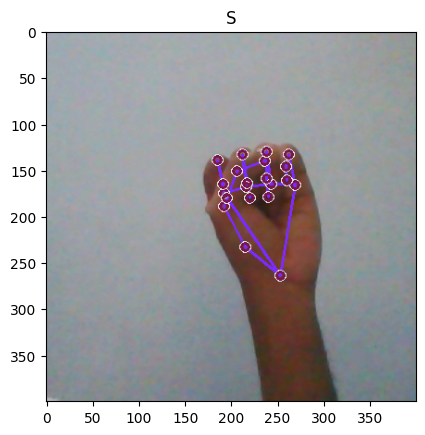

Processed class S (28/28)


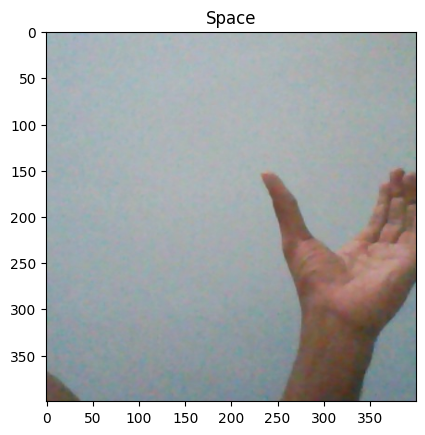

Processed class Space (28/28)


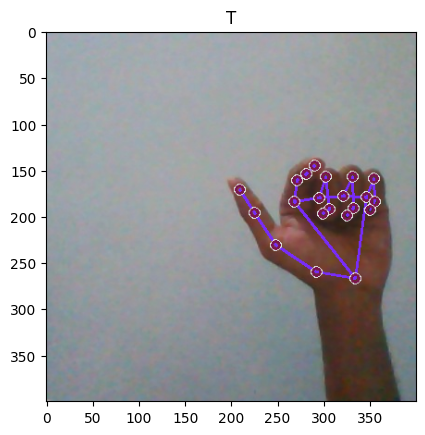

Processed class T (28/28)


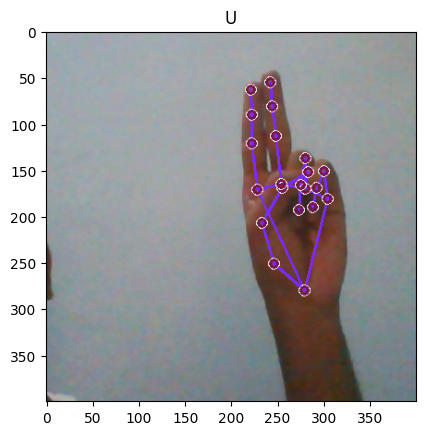

Processed class U (28/28)


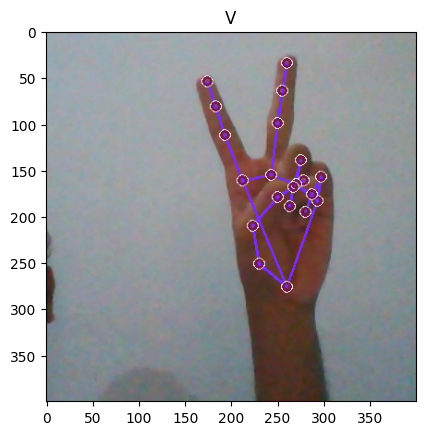

Processed class V (28/28)


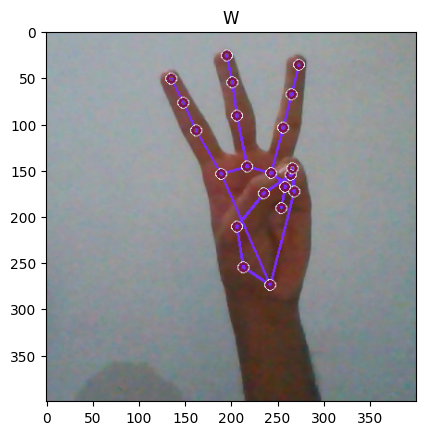

Processed class W (28/28)


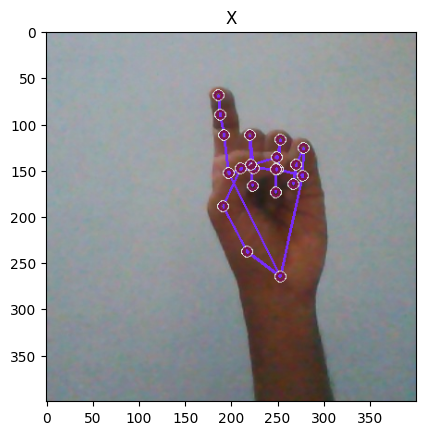

Processed class X (28/28)


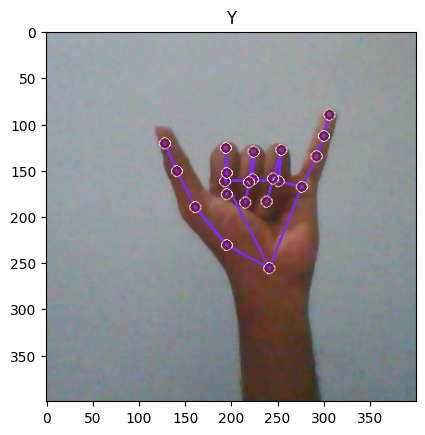

Processed class Y (28/28)


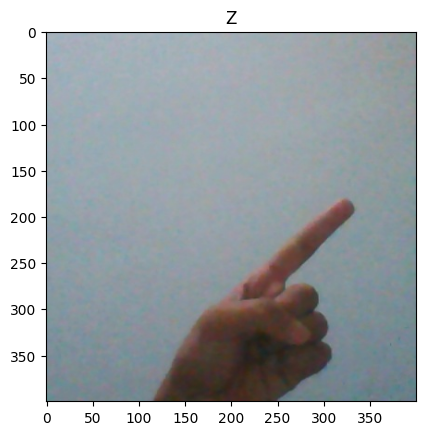

Processed class Z (28/28)


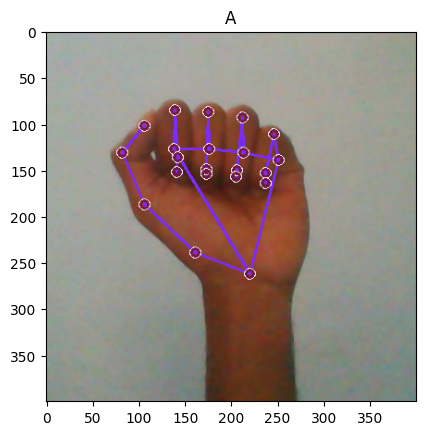

Processed class A (28/28)


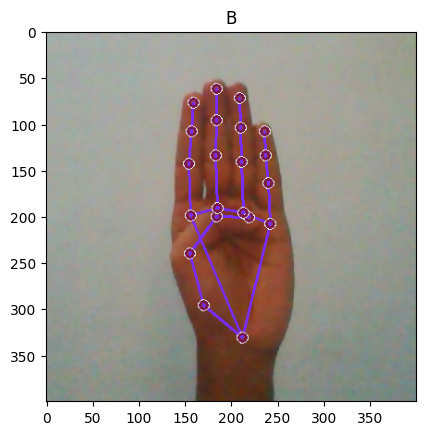

Processed class B (28/28)


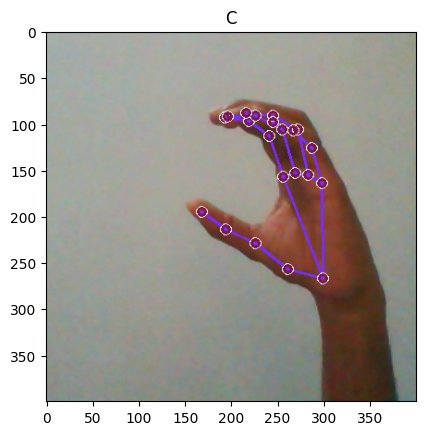

Processed class C (28/28)


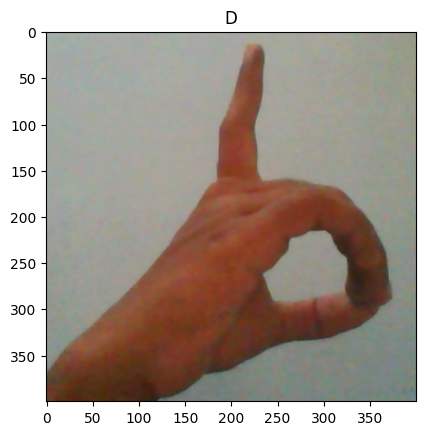

Processed class D (28/28)


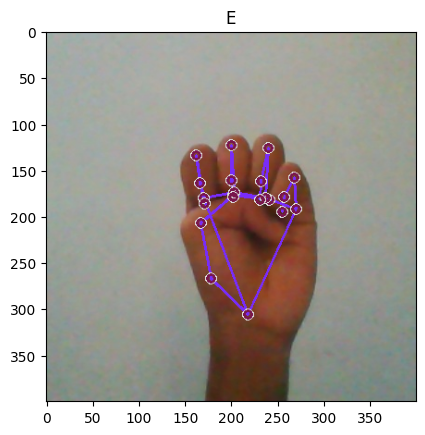

Processed class E (28/28)


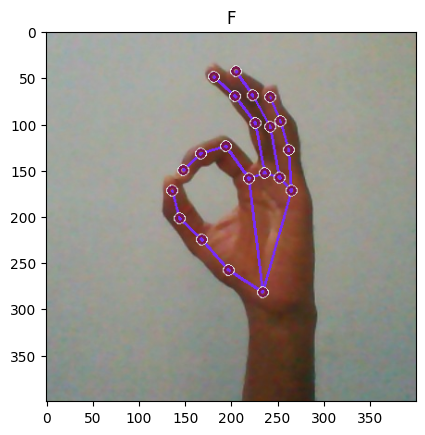

Processed class F (28/28)


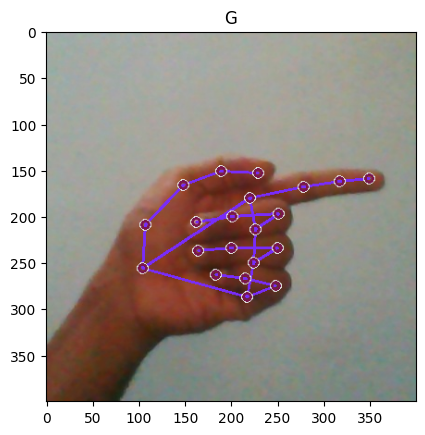

Processed class G (28/28)


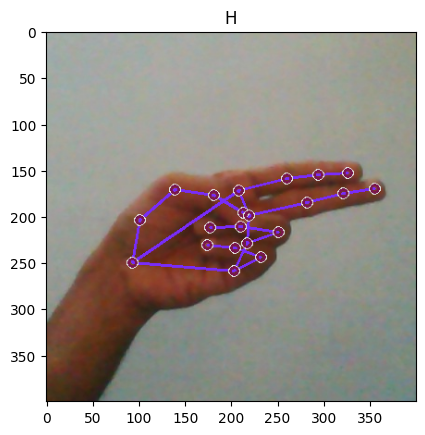

Processed class H (28/28)


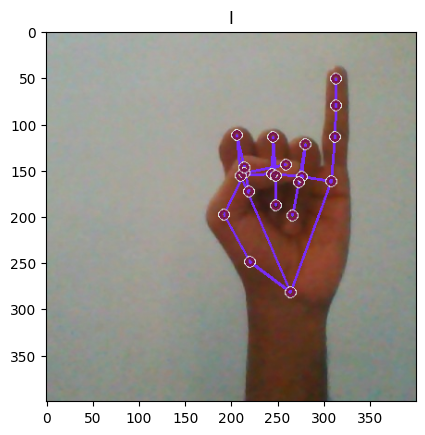

Processed class I (28/28)


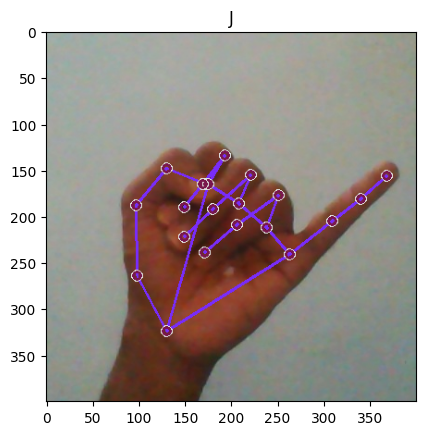

Processed class J (28/28)


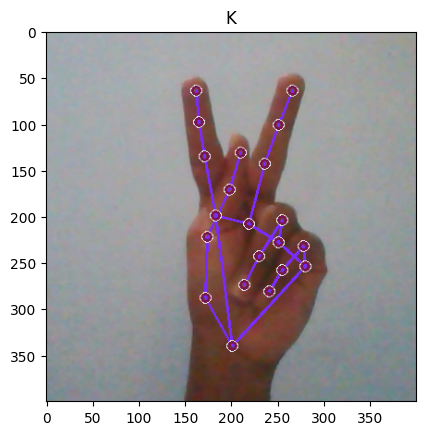

Processed class K (28/28)


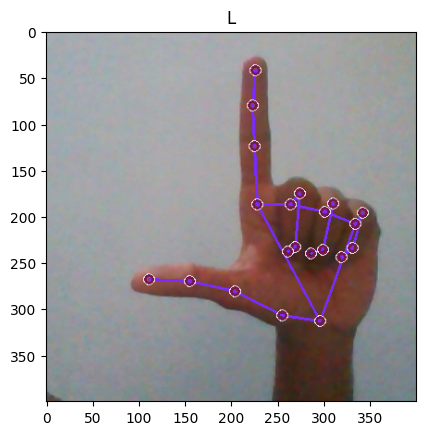

Processed class L (28/28)


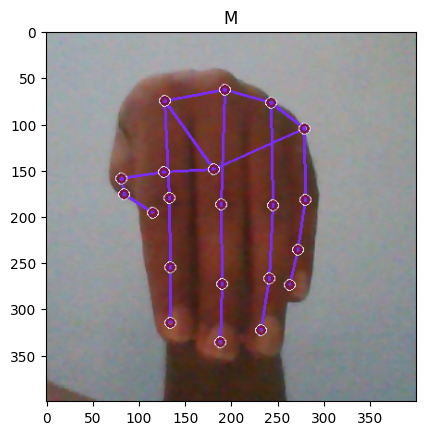

Processed class M (28/28)


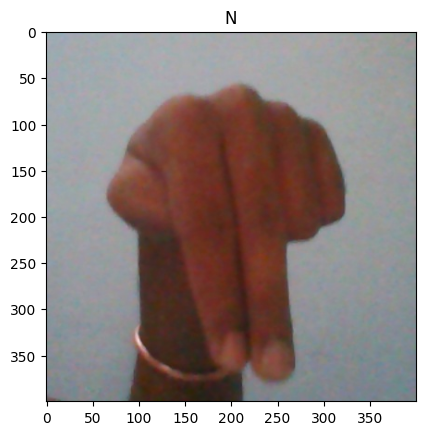

Processed class N (28/28)


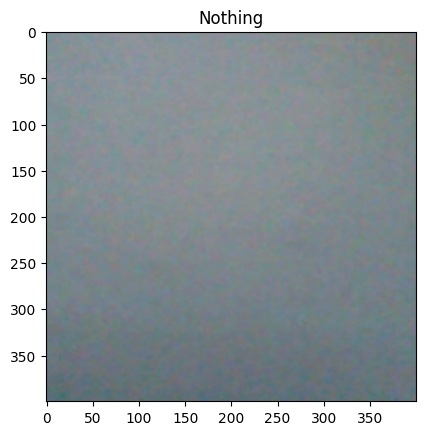

Processed class Nothing (28/28)


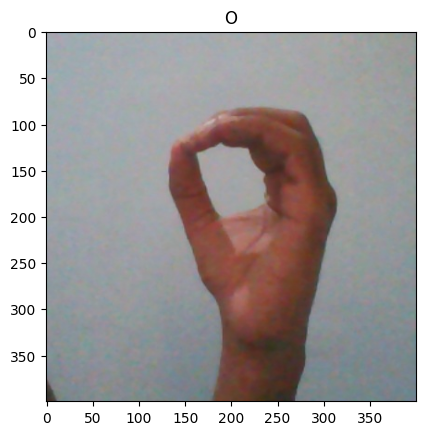

Processed class O (28/28)


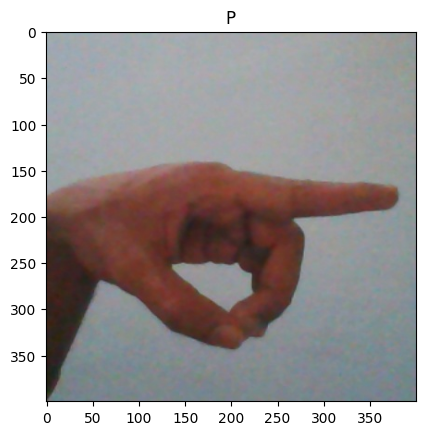

Processed class P (28/28)


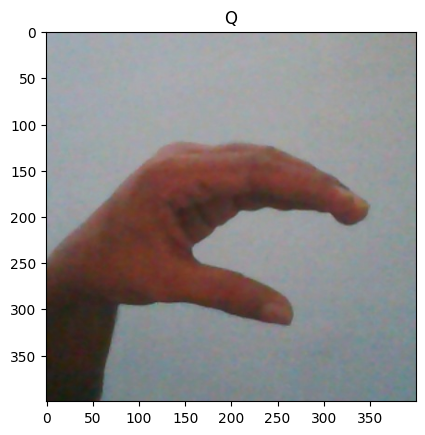

Processed class Q (28/28)


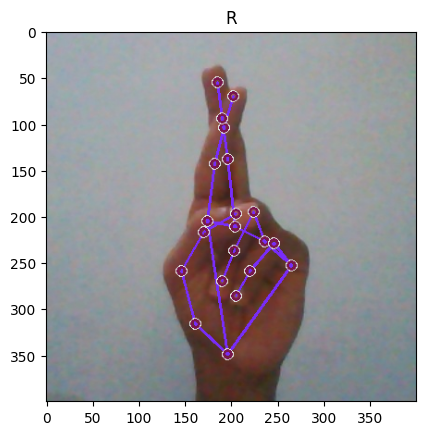

Processed class R (28/28)


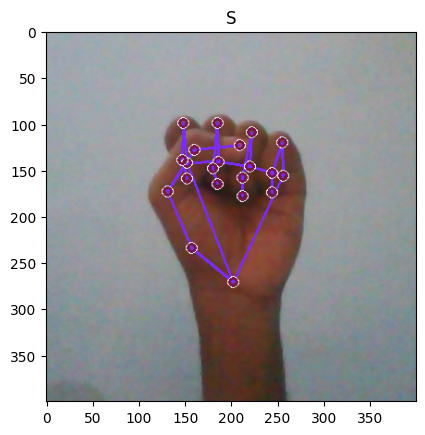

Processed class S (28/28)


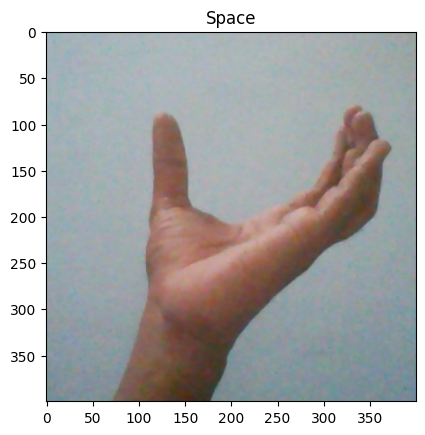

Processed class Space (28/28)


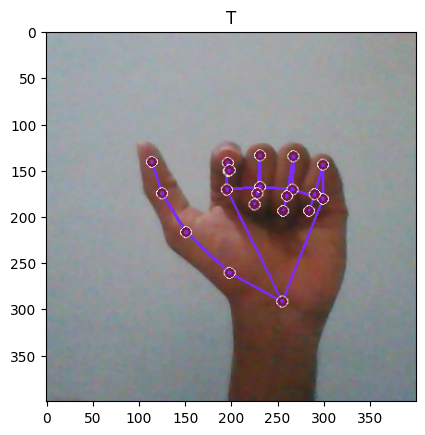

Processed class T (28/28)


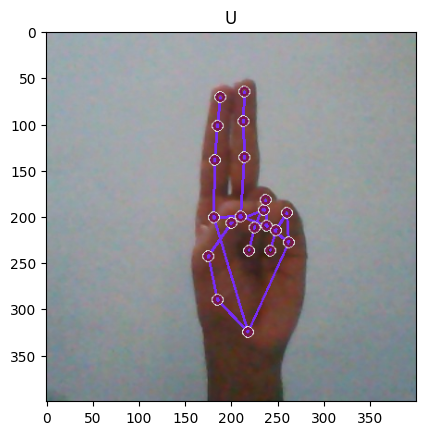

Processed class U (28/28)


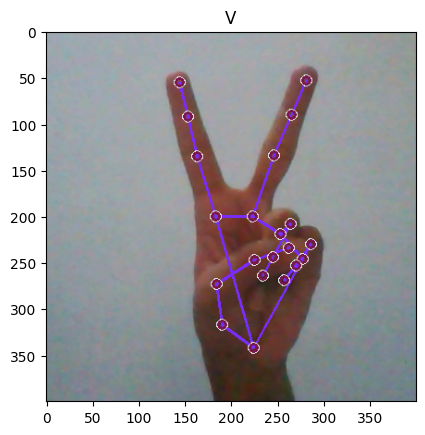

Processed class V (28/28)


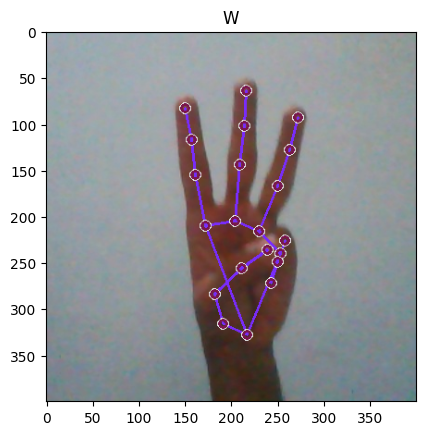

Processed class W (28/28)


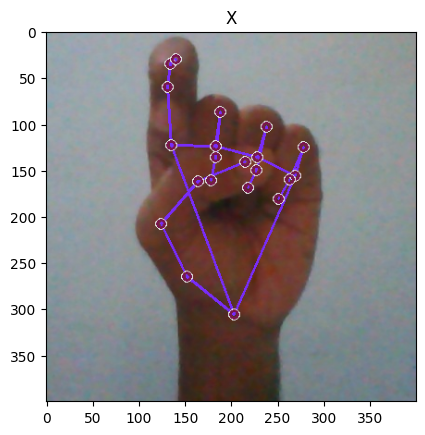

Processed class X (28/28)


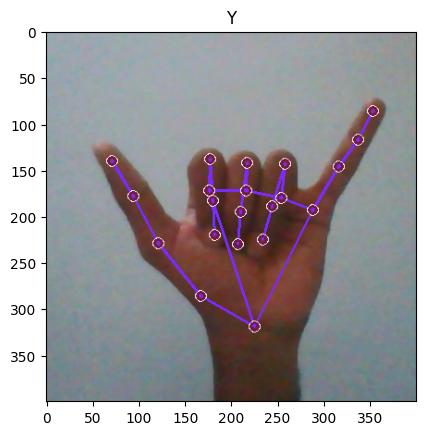

Processed class Y (28/28)


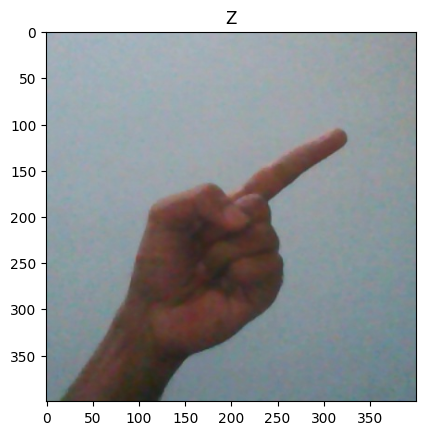

Processed class Z (28/28)


In [5]:
# import os
# import cv2
# import matplotlib.pyplot as plt
# import mediapipe as mp

# mp_drawing = mp.solutions.drawing_utils
# mp_hands = mp.solutions.hands
# hands = mp_hands.Hands(static_image_mode=True)

data_dir = 'asl_dataset'
sub_dirs = ['train', 'test']

for sub_dir in sub_dirs:
    for i in sorted(os.listdir(os.path.join(data_dir, sub_dir))):
        if i == '.DS_Store':
            continue
        for j in os.listdir(os.path.join(data_dir, sub_dir, i))[0:1]:
            img_path = os.path.join(data_dir, sub_dir, i, j)
            if os.path.isfile(img_path):  # Check if it's a file, not a directory
                img = cv2.imread(img_path)
                if img is not None:
                    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                    results = hands.process(img_rgb)
                    if results.multi_hand_landmarks:
                        for hand_landmarks in results.multi_hand_landmarks:
                            mp_drawing.draw_landmarks(
                                img_rgb,  # img to draw
                                hand_landmarks,
                                mp_hands.HAND_CONNECTIONS,
                                mp_drawing.DrawingSpec(color=(121, 22, 76), thickness=2, circle_radius=4),
                                mp_drawing.DrawingSpec(color=(121, 44, 250), thickness=2, circle_radius=2)
                            )

                    plt.figure()
                    plt.title(i)
                    plt.imshow(img_rgb)
                    plt.show()
                else:
                    print(f"Image not loaded: {img_path}")
            else:
                print(f"Skipped directory: {img_path}")
        print(f"Processed class {i} ({idx+1}/{len(os.listdir(os.path.join(data_dir, sub_dir)))})")

# Training

Mulai dari sini samppai bawah, code tidak saya run di Kaggle karena akan banyak memakan waktu (sebelumnya sudah saya run di komputer pribadi ), berikut saya sertakan codenya dan silahkan coba sendiri :)

In [9]:
# # split data
# X_train, X_test, y_train, y_test = train_test_split(np.array(data), labels, test_size=0.15, random_state=22, shuffle=True)

# # model
# model = RandomForestClassifier(random_state=22)
# model.fit(X_train,y_train)

# # predict
# pred=model.predict(X_test)

# # accruracy
# accuracy_score(y_test,pred)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pickle

# Load data
with open('data.pickle', 'rb') as f:
    data = pickle.load(f)

X = np.array(data['data'])
y = np.array(data['labels'])

# Encode labels
encoder = LabelEncoder()
y = encoder.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define model
model = Sequential()
model.add(Dense(128, input_dim=X.shape[1], activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(len(np.unique(y)), activation='softmax'))  # Number of classes

# Compile model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Save the model
model.save('asl_model.h5')

# Evaluate model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Accuracy: {accuracy*100}%")



Epoch 1/10
3117/3117 [==============================] - 11s 2ms/step - loss: 0.4208 - accuracy: 0.9059 - val_loss: 0.0253 - val_accuracy: 0.9979
Epoch 2/10
3117/3117 [==============================] - 8s 3ms/step - loss: 0.0144 - accuracy: 0.9979 - val_loss: 0.0106 - val_accuracy: 0.9984
Epoch 3/10
3117/3117 [==============================] - 7s 2ms/step - loss: 0.0067 - accuracy: 0.9987 - val_loss: 0.0057 - val_accuracy: 0.9986
Epoch 4/10
3117/3117 [==============================] - 7s 2ms/step - loss: 0.0048 - accuracy: 0.9988 - val_loss: 0.0101 - val_accuracy: 0.9957
Epoch 5/10
3117/3117 [==============================] - 7s 2ms/step - loss: 0.0046 - accuracy: 0.9986 - val_loss: 0.0012 - val_accuracy: 0.9997
Epoch 6/10
3117/3117 [==============================] - 7s 2ms/step - loss: 0.0033 - accuracy: 0.9991 - val_loss: 0.0020 - val_accuracy: 0.9996
Epoch 7/10
3117/3117 [==============================] - 8s 2ms/step - loss: 0.0030 - accuracy: 0.9992 - val_loss: 0.0016 - val_accuracy

c:\Users\maaas\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


780/780 [==============================] - 1s 2ms/step - loss: 9.6498e-04 - accuracy: 0.9998
Accuracy: 99.98395442962646%


In [7]:
# save model
f = open('model.p', 'wb')
pickle.dump({'model':model},f)
f.close() 

In [13]:
from sklearn.metrics import classification_report
import numpy as np

# Predict labels for test data
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Evaluate model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Accuracy: {accuracy*100}%")

# Calculate precision, recall, and F1 score
report = classification_report(y_test, y_pred, output_dict=True)
print(f"Precision: {report['macro avg']['precision']*100}%")
print(f"Recall: {report['macro avg']['recall']*100}%")
print(f"F1 Score: {report['macro avg']['f1-score']*100}%")

780/780 [==============================] - 1s 2ms/step - loss: 9.6498e-04 - accuracy: 0.9998
Accuracy: 99.98395442962646%
Precision: 99.97480987755083%
Recall: 99.8768586536073%
F1 Score: 99.92482082018603%


780/780 [==============================] - 1s 2ms/step


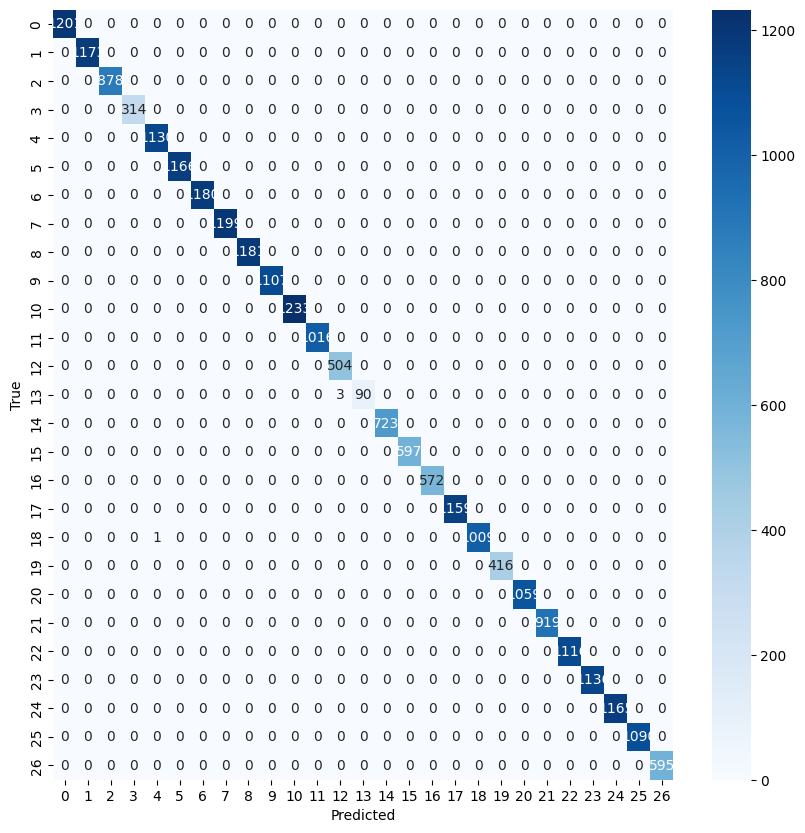

In [15]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Predict labels for test data
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [18]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer

from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

# For each class
precision = dict()
recall = dict()
average_precision = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i],
                                                        y_pred_bin[:, i])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_pred_bin[:, i])

# A "micro-average": quantifying score on all classes jointly
precision["micro"], recall["micro"], _ = precision_recall_curve(y_test_bin.ravel(),
    y_pred_bin.ravel())
average_precision["micro"] = average_precision_score(y_test_bin, y_pred_bin,
                                                     average="micro")
plt.figure()
plt.step(recall['micro'], precision['micro'], where='post')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title(
    'Average precision score, micro-averaged over all classes: AP={0:0.2f}'
    .format(average_precision["micro"]))

NameError: name 'num_classes' is not defined

# Detection

In [19]:
# load model
import pickle
model_dict = pickle.load(open('model.p','rb'))
model = model_dict['model']

Untuk mematikannya, tekan 'q'

In [21]:
import cv2
import mediapipe as mp

cap = cv2.VideoCapture(0)

with mp_hands.Hands(min_detection_confidence=0.8, min_tracking_confidence=0.8) as hands:
    while cap.isOpened():

        data_aux=[]
        x_ = []
        y_ = []

        ret, frame = cap.read()
        H, W, _ = frame.shape

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame_rgb = cv2.flip(frame_rgb, 1)
        frame_rgb.flags.writeable = False
        results = hands.process(frame_rgb)
        frame_rgb.flags.writeable = True 
        frame_rgb = cv2.cvtColor(frame_rgb, cv2.COLOR_RGB2BGR)
        if results.multi_hand_landmarks:
            for hand_landmarks in results.multi_hand_landmarks:
                mp_drawing.draw_landmarks(
                    frame_rgb, # img to draw
                    hand_landmarks,
                    mp_hands.HAND_CONNECTIONS,
                    mp_drawing.DrawingSpec(color=(28, 255, 3), thickness=5, circle_radius=10),
                    mp_drawing.DrawingSpec(color=(236, 255, 3), thickness=5, circle_radius=10)
                )


            for hand_landmarks in results.multi_hand_landmarks:
                for i in range(len(hand_landmarks.landmark)):
                    x = hand_landmarks.landmark[i].x
                    y = hand_landmarks.landmark[i].y
                    data_aux.append(x)
                    data_aux.append(y)
                    x_.append(x)
                    y_.append(y)

            x1 = int(min(x_) * W)-10
            y1 = int(min(y_) * H)-10

            x2 = int(max(x_) * W)-10
            y2 = int(max(y_) * H)-10
            prediction = model.predict([np.array(data_aux)[0:42]])[0]

            cv2.rectangle(frame_rgb, (x1,y1-10), (x2,y2), (255,99,173), 6)
            cv2.putText(frame_rgb, prediction, (x1,y1), cv2.FONT_HERSHEY_DUPLEX, 5, (255,0,0), 5, cv2.LINE_AA)

        cv2.imshow('frame',frame_rgb)  
        # cv2.waitKey(1)
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
cap.release()
cv2.destroyAllWindows()

NameError: name 'mp_hands' is not defined